### DATA: IF1, IF2, IF3, supplementary biomarkers

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

In [2]:
#IF1
data1=r"data\phenotype_translating_result_IF1.tsv"
df1=pd.read_csv(data1, sep='\t')
df1.drop(columns=df1.columns[0], axis=1, inplace=True)

#IF2
data2=r"data\phenotype_translating_result_IF2.tsv"
df2=pd.read_csv(data2, sep='\t')
df2.drop(columns=df2.columns[0], axis=1, inplace=True)

#IF3
data3=r"data\phenotype_translating_result_IF3.tsv"
df3=pd.read_csv(data3, sep='\t')
df3.drop(columns=df3.columns[0], axis=1, inplace=True)

#IF_dispersions
datadis=r"data\IF_dispersion.xlsx"
dfdis=pd.read_excel(datadis)
dfdis.drop(columns='IF_groups', axis=1, inplace=True)
dfdis=dfdis.dropna().reset_index(drop=True)
dfdis.columns=['patient', dfdis.columns[1], dfdis.columns[2]] # changing first column name to 'patient'

#PDL1_scores
dataPDL=r"data\PDL1_scores.csv"
dfPDL=pd.read_csv(dataPDL)
dfPDL.drop(columns=['TPS_score', 'CPS_score'], axis=1, inplace=True) # droping columns
dfPDL=dfPDL.dropna().reset_index(drop=True)
dfPDL.columns=['patient', dfPDL.columns[1], dfPDL.columns[2]] # changing first column name to 'patient'

#signatures
signatures_path=r"data\Lung_NSCLC2.tsv"
signatures=pd.read_csv(signatures_path, sep='\t')
signatures=signatures.drop(columns=['sample_vs_control', 'accuracy'])
signatures['Smoking']=signatures['SBS4']+signatures['SBS92']
signatures['APOBEC']=signatures['SBS2']+signatures['SBS13']
signatures['Age_related']=signatures['SBS1']+signatures['SBS5'] #poor quality

In [3]:
def plots(data, signatures, title, no_zeros, save=False):

    nr_sig=len(signatures.columns)-1 # number of signatures
    nr_cell=len(data.columns)-1 # number of cells


    fig, axes = plt.subplots(nr_sig, nr_cell, figsize=(4*nr_cell, 50)) # plot grid

    pvalues=[]
    corrs=[]

    for i in range(1, nr_sig+1):
            
        for j in range(1, nr_cell+1):
                
            sig=signatures.columns[i]
            cell=data.columns[j]

            df_merged = pd.merge(data[['patient', cell]], signatures[['patient', sig]], on='patient') # creating data frame with columns 'patient', cell, sig

            if(no_zeros): # if we don't want to include instances where sig count is 0
                df_merged=df_merged[df_merged[sig]!=0]
            
            corr, p=stats.spearmanr(df_merged[sig], df_merged[cell]) # Spearman correlation
            corrs.append(corr)
            pvalues.append(p)

            axes[i-1, j-1].scatter(df_merged[sig], df_merged[cell], label='Data points') # plotting sig vs cell


            # linear regression and plotting the best fit line
            slope, intercept, _, _, _ = stats.linregress(df_merged[sig], df_merged[cell])

            x_vals = df_merged[sig]
            y_vals = slope * x_vals + intercept
            axes[i-1, j-1].plot(x_vals, y_vals, color='red', label='Fit line')

            # plot details
            axes[i-1, j-1].set_xlabel(sig)
            axes[i-1, j-1].set_ylabel(cell)
            axes[i-1, j-1].set_title(f'{title}: {sig} vs {cell}')
            axes[i-1, j-1].legend(loc='upper left')



    pvalues_cor=stats.false_discovery_control(pvalues) # p-value correction (Benjamini-Hochberg)
    pvalues_matrix=[pvalues[i : i+nr_cell] for i in range(0, len(pvalues), nr_cell)]
    pvalues_matrix_cor=[pvalues_cor[i : i+nr_cell] for i in range(0, len(pvalues_cor), nr_cell)]
    corrs_matrix=[corrs[i : i+nr_cell] for i in range(0, len(corrs), nr_cell)]

    best_pvalue=[] # tables of cells and sigs with best p-value

    count = 0
    
    
    for i in range(0, nr_sig):
        for j in range(0, nr_cell):
            corr=corrs_matrix[i][j]
            p=pvalues_matrix[i][j]
            p_cor=pvalues_matrix_cor[i][j]
            axes[i, j].text(0.95, 0.95, f'corr: {corr:.4f}\n p-value: {p:.4f}\n cor. p-value: {p_cor:.4f}', transform=axes[i, j].transAxes, ha='right', va='top') # adding corr and p-val to the plot

            if p_cor<=0.05:
                best_pvalue.append((data.columns[j+1], signatures.columns[i+1], (p, p_cor)))
                count+=1


    plt.tight_layout()
    plt.show()

    table_pvalue=pd.DataFrame(best_pvalue, columns=['Cell', 'Signature', 'P-value']) # making a table out of a list
    table_pvalue = table_pvalue.pivot(index='Cell', columns='Signature', values='P-value') # organizing data

    if save:
        pvalues_matrix=pd.DataFrame(pvalues_matrix_cor, columns=data.columns[1:], index=signatures.columns[1:])
        corrs_matrix=pd.DataFrame(corrs_matrix, columns=data.columns[1:], index=signatures.columns[1:])
        pvalues_matrix.to_csv(f"p_values_{title}.tsv", sep='\t')
        corrs_matrix.to_csv(f"correlations_{title}.tsv", sep='\t')

    print(f"Number of significant correlations (p-value < 0.05): {count} out of {nr_sig * nr_cell} ({count/(nr_sig * nr_cell) * 100:.2f}%)")
    return (table_pvalue)

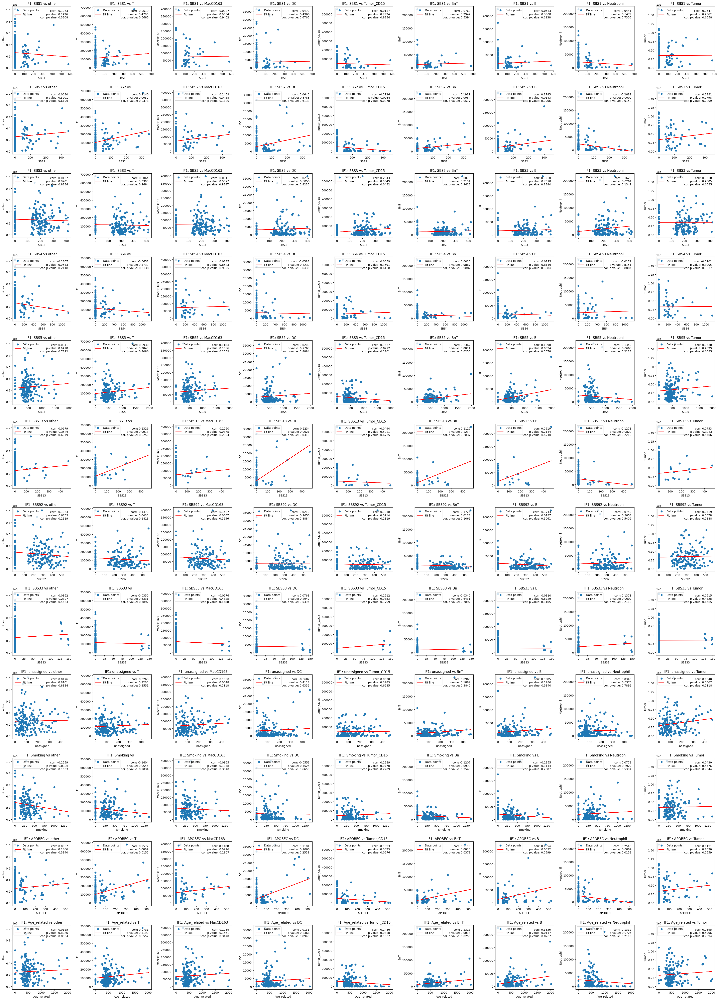

Number of significant correlations (p-value < 0.05): 11 out of 108 (10.19%)
Signature                                           APOBEC  \
Cell                                                         
BnT            (0.003502551571043168, 0.03782755696726622)   
DC                                                     NaN   
Neutrophil   (0.0004224675036350153, 0.015208830130860551)   
T           (0.00036644883211955426, 0.015208830130860551)   
Tumor_CD15                                             NaN   

Signature                                     Age_related  \
Cell                                                        
BnT         (0.0013900895765994157, 0.025021612378789485)   
DC                                                    NaN   
Neutrophil                                            NaN   
T                                                     NaN   
Tumor_CD15                                            NaN   

Signature                                           SBS13  \


In [4]:
table1=plots(df1, signatures, 'IF1', False)
print(table1)

In [5]:
table2=plots(df2, signatures, 'IF2', False, True)
print(table2)

Number of significant correlations (p-value < 0.05): 66 out of 312 (21.15%)
Signature                                                   APOBEC  \
Cell                                                                 
CD8                  (0.0002420078268684864, 0.006864221998451614)   
CD8_GB               (0.0041804368688866875, 0.030332472164945265)   
CD8_GB_PDL1          (0.0006073664534521926, 0.010290351118890206)   
CD8_Ki67            (9.272167847488228e-06, 0.0008371837670975366)   
CD8_Ki67_GB           (0.0005505329085467743, 0.01010389808627021)   
CD8_Ki67_GB_PDL1     (0.0009137082313725348, 0.012394650790792645)   
CD8_Ki67_PDL1      (1.0119276739815414e-05, 0.0008371837670975366)   
CD8_PD1_GB                                                     NaN   
CD8_PD1_GB_PDL1      (0.0054740794692299454, 0.034855363151015166)   
CD8_PD1_Ki67                                                   NaN   
CD8_PD1_Ki67_GB                                                NaN   
CD8_PD1_Ki67_P

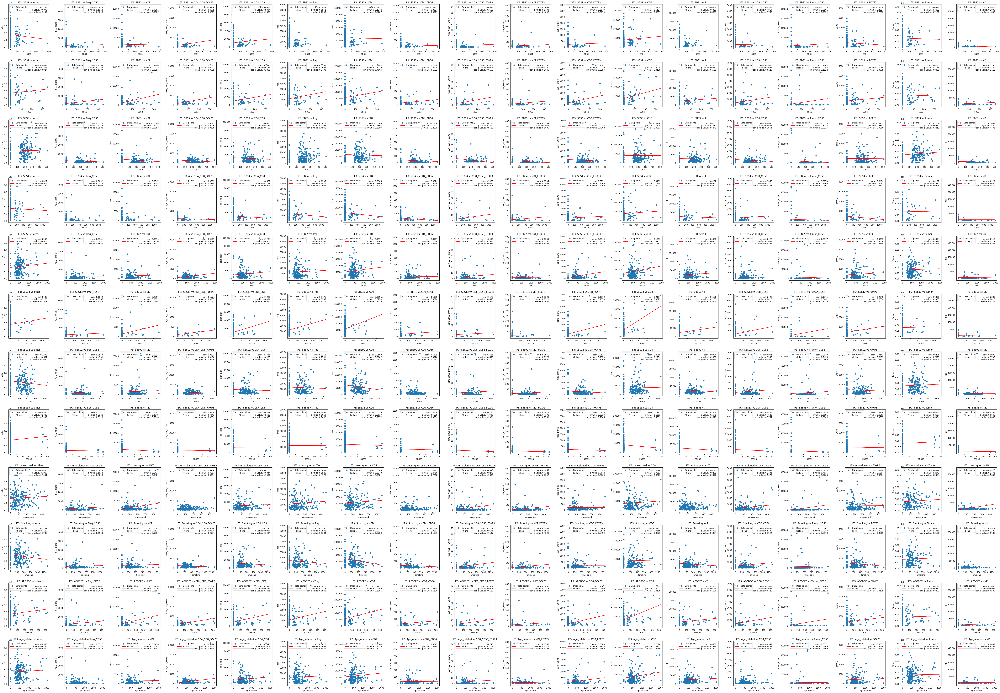

Number of significant correlations (p-value < 0.05): 18 out of 216 (8.33%)
Signature                                              APOBEC  \
Cell                                                            
CD4                                                       NaN   
CD4_CD8_FOXP3   (0.0011676334900446962, 0.019400679526896492)   
CD8              (6.78295356108302e-05, 0.012947405970959508)   
CD8_CD56        (0.0001225735499663325, 0.012947405970959508)   
CD8_CD56_FOXP3  (0.0002966265941272818, 0.012947405970959508)   
CD8_FOXP3        (0.0005341791208700023, 0.01594529684032082)   
FOXP3           (0.0003262444839170495, 0.012947405970959508)   
NK                                                        NaN   
NKT             (0.0009971822388922863, 0.019400679526896492)   

Signature                                               SBS13  \
Cell                                                            
CD4                                                       NaN   
CD4_CD8_FOXP3 

In [6]:
table3=plots(df3, signatures, 'IF3', False)
print(table3)

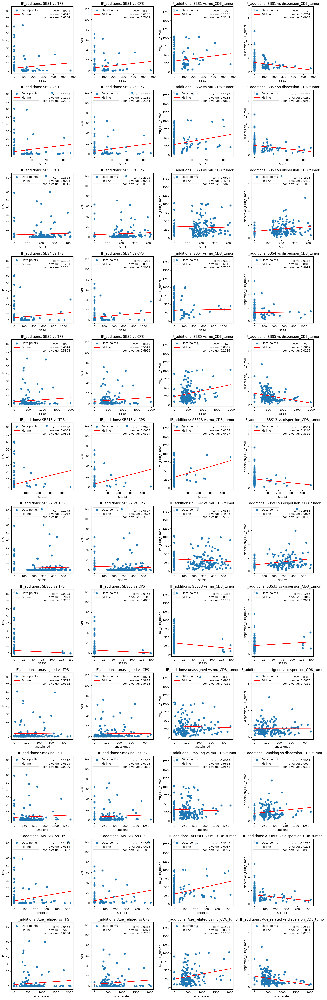

Number of significant correlations (p-value < 0.05): 10 out of 48 (20.83%)
Signature                                                   APOBEC  \
Cell                                                                 
CPS                                                            NaN   
TPS                                                            NaN   
dispersion_CD8_tumor                                           NaN   
mu_CD8_tumor          (0.0037123817111339164, 0.02969905368907133)   

Signature                                               Age_related  \
Cell                                                                  
CPS                                                             NaN   
TPS                                                             NaN   
dispersion_CD8_tumor  (0.0010859911235783705, 0.013031893482940447)   
mu_CD8_tumor                                                    NaN   

Signature                                                    SBS13  \
Cell   

In [ ]:
df_PDL1_disp = pd.merge(dfPDL, dfdis, on='patient', how='inner') # connecting additions
table4=plots(df_PDL1_disp, signatures, 'IF_additions', False, True)
print(table4)